In [2]:
from astropy.coordinates import SkyCoord, concatenate
import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np

## Locations of failed downloads

In [3]:
# Plot everything first
# Get the HSC clusters
f = open("camira_s20a_wide.tbl")
ras = []
decs = []
zs = []
richnesses = []
for i, line in enumerate(f): 
    if i < 9: continue
    id, name, ra, dec, z, richness, bcg_z = list(filter(None, line.strip().split(' ')))
    if float(z) <= 0.5:
        ras.append(ra)
        decs.append(dec)
        zs.append(float(z)) 
        richnesses.append(float(richness))

# Make SkyCoords
hsc_coords = SkyCoord(ras, decs, unit=u.deg)

f = open("camira_s20a_dud.tbl")
ras_dud = []
decs_dud = []
for i, line in enumerate(f): 
    if i < 9: continue
    id, name, ra, dec, z, richness, bcg_z = list(filter(None, line.strip().split(' ')))
    if float(z) <= 0.5:
        ras_dud.append(ra)
        decs_dud.append(dec)
        zs.append(float(z)) 
        richnesses.append(float(richness))

# Make SkyCoords
hsc_dud_coords = SkyCoord(ras_dud, decs_dud, unit=u.deg)

# Remove the duplicate galaxies in hsc_coords
_, idx, _, _ = hsc_coords.search_around_sky(hsc_dud_coords, 25*u.arcsec)
mask = np.ones(len(hsc_coords), dtype=bool)
mask[idx] = 0

hsc_coords = hsc_coords[mask]

print(len(hsc_coords), len(hsc_dud_coords))

2676 130


In [4]:
# Get a list of the failed downloads
f = open("../cutouts/failed_downloads.txt")
failed = [[], []]
cat = -1

for line in f:
    words = line.split(' ')
    if words[0] == "Clusters":
        cat += 1
    else:
        idx = line.split(' ')[1]
        failed[cat].append(int(idx))

failed_dud = hsc_dud_coords[failed[0]]
failed_wide = hsc_coords[failed[1]]
failed = concatenate((failed_dud, failed_wide))

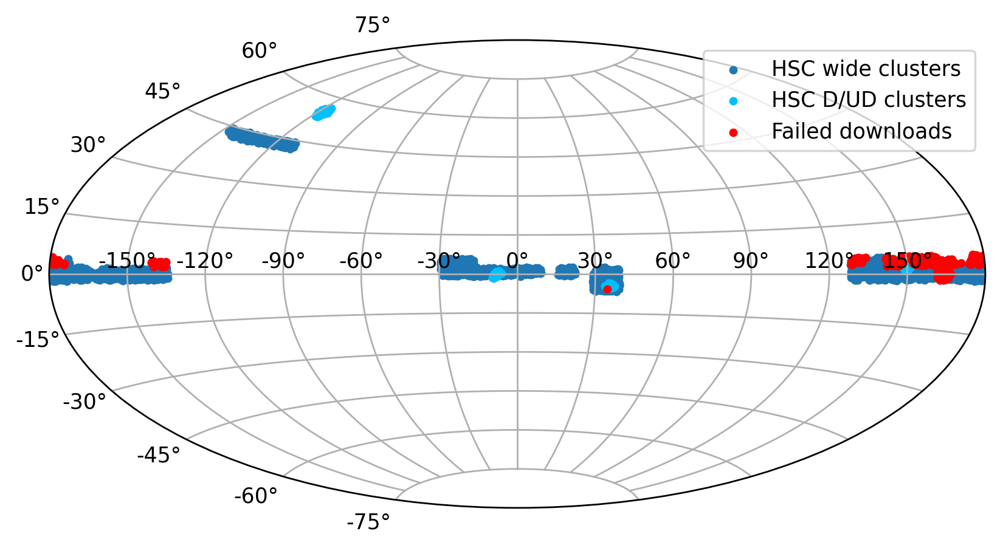

In [5]:
# Plot both sets of coordinates
hsc_ra = hsc_coords.icrs.ra.wrap_at(180*u.deg).radian
hsc_dec = hsc_coords.icrs.dec.radian

hsc_dud_ra = hsc_dud_coords.icrs.ra.wrap_at(180*u.deg).radian
hsc_dud_dec = hsc_dud_coords.icrs.dec.radian

failed_ra = failed.icrs.ra.wrap_at(180*u.deg).radian
failed_dec = failed.icrs.dec.radian

fig = plt.figure(figsize=(8,4), dpi=250)
plt.subplot(111, projection='aitoff')
plt.grid(True)
plt.scatter(hsc_ra, hsc_dec, marker='.')
plt.scatter(hsc_dud_ra, hsc_dud_dec, marker='.', color="deepskyblue")
plt.scatter(failed_ra, failed_dec, marker='.', color='red')
plt.legend(["HSC wide clusters", "HSC D/UD clusters", "Failed downloads"])
plt.show()

## Image examples

In [6]:
from astropy.io import fits
from astropy.visualization import ImageNormalize, LogStretch
import glob
import matplotlib.pyplot as plt
import numpy as np

cutouts_path = "../cutouts/"

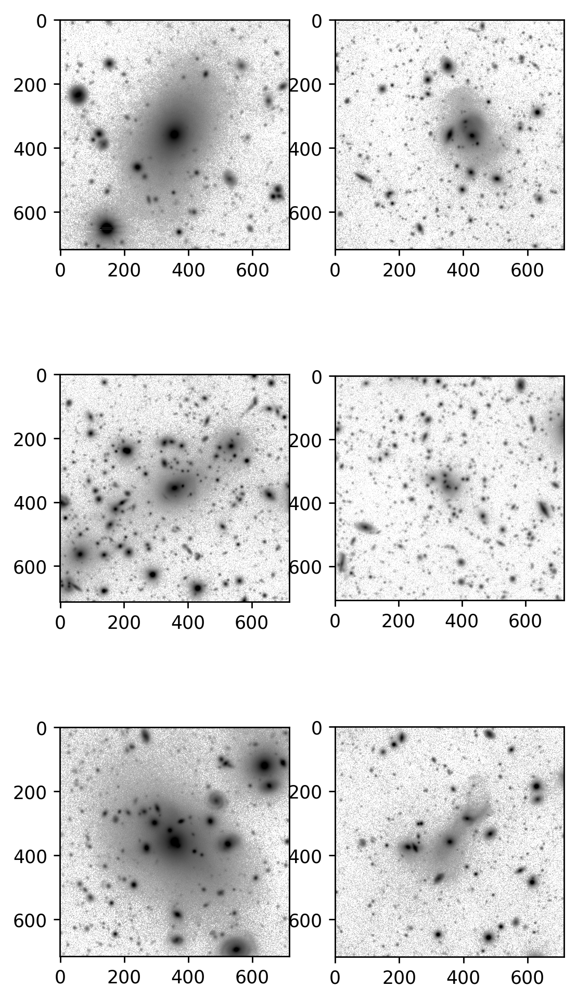

In [7]:
files = sorted(glob.glob(f"{cutouts_path}*.fits"))
ex = [443, 626, 1555, 71, 715, 1974]
images = []

for i in ex:
    file = fits.open(files[i])
    images.append(file[1].data)

norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

plt.figure(figsize=(5,10), dpi=250)
for i in range(6):
    plt.subplot(3, 2, i+1)
    plt.imshow(images[i], norm=norm, cmap="gray_r")
plt.show()

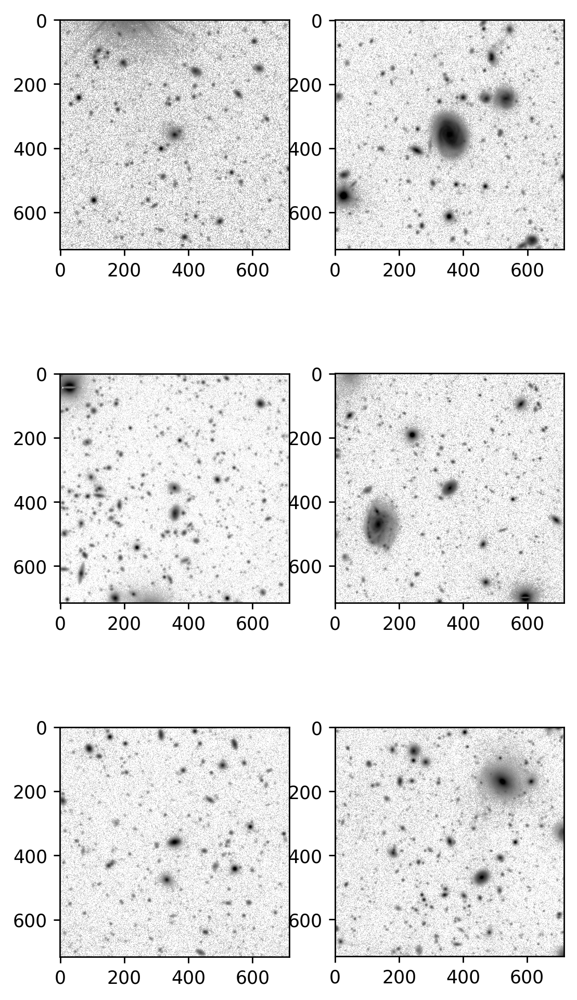

In [11]:
files = sorted(glob.glob(f"{cutouts_path}*.fits"))
ex = [825, 2372, 108, 575, 1042, 2114]
images = []

for i in ex:
    file = fits.open(files[i])
    images.append(file[1].data)

norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

plt.figure(figsize=(5,10), dpi=250)
for i in range(6):
    plt.subplot(3, 2, i+1)
    plt.imshow(images[i], norm=norm, cmap="gray_r")
plt.show()

In [109]:
#### This code isn't valid anymore since the bad images have now been moved to a different directory

# from matplotlib.backends.backend_pdf import PdfPages
# # Show the bad images and save them into a PDF file
# bad = [19, 113, 126, 156, 172, 303, 304, 323, 365, 431, 469, 479, 483, 541, 552, 558, 614, 654, 746, 831, 849, 1006, 1165, 1199, 1254, 1271, 1312, 1450, 1454, 1521, 1544, 1626, 1633, 1700, 1770, 1771, 1820, 1869, 2058, 2059, 2145, 2201, 2247, 2265, 2309, 2331, 2334, 2357, 2366, 2449, 2463]
# images = []
# for i in bad:
#     file = fits.open(files[i])
#     images.append(file[1].data)

# norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

# plt.close()
# with PdfPages("bad_imgs.pdf") as pdf:
#     i = 0
#     while i < len(bad):
#         plt.figure(figsize=(5,10), dpi=150)
#         for sp in range(6):
#             plt.subplot(3, 2, sp+1)
#             plt.imshow(images[i], norm=norm, cmap="gray_r")
#             i+=1
#             if i == len(bad): break
#         # end of page
#         pdf.savefig()
#         plt.close()

In [112]:
# Show the ? images and save them into a PDF file - not valid anymore since these images have been moved
# idk = [28, 29, 46, 60, 68, 88, 105, 258, 269, 318, 325, 351, 457, 508, 643, 731, 754, 770, 835, 889, 921, 924, 962, 998, 1100, 1135, 1246, 1266, 1422, 1510, 1516, 1545, 1616, 1795, 1879, 1900, 1944, 1981, 2004, 2062, 2082, 2109, 2218, 2232, 2286, 2290, 2329, 2409, 2431, 2440, 2461]
# images = []
# for i in idk:
#     file = fits.open(files[i])
#     images.append(file[1].data)

# norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

# plt.close()
# with PdfPages("?_imgs.pdf") as pdf:
#     i = 0
#     while i < len(idk):
#         plt.figure(figsize=(5,10), dpi=150)
#         for sp in range(6):
#             plt.subplot(3, 2, sp+1)
#             plt.imshow(images[i], norm=norm, cmap="gray_r")
#             i+=1
#             if i == len(idk): break
#         # end of page
#         pdf.savefig()
#         plt.close()

In [12]:
# Save the cool images into a pdf file
from matplotlib.backends.backend_pdf import PdfPages

cool = [2109, 697, 592, 1891, 590, 1289, 2270, 2222, 1713, 858, 1333, 2247, 1672, 641, 1827, 2231, 1162, 774]
images = []
for i in cool:
    file = fits.open(files[i])
    images.append(file[1].data)

norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

plt.close()
with PdfPages("cool_imgs.pdf") as pdf:
    i = 0
    while i < len(cool):
        plt.figure(figsize=(5,10), dpi=150)
        for sp in range(6):
            plt.subplot(3, 2, sp+1)
            plt.imshow(images[i], norm=norm, cmap="gray_r")
            i+=1
            if i == len(cool): break
        # end of page
        pdf.savefig()
        plt.close()

In [10]:
### Bad clusters already removed - indices not valid anymore

# import os
# Remove the bad and ? clusters
# idx_to_remove = [19, 113, 126, 156, 172, 303, 304, 323, 365, 431, 469, 479, 483, 541, 552, 558, 614, 654, 746, 831, 849, 1006, 1165, 1199, 1254, 1271, 1312, 1450, 1454, 1521, 1544, 1626, 1633, 1700, 1770, 1771, 1820, 1869, 2058, 2059, 2145, 2201, 2247, 2265, 2309, 2331, 2334, 2357, 2366, 2449, 2463, 46, 60, 68, 88, 258, 318, 325, 351, 457, 508, 643, 731, 754, 770, 835, 889, 921, 924, 962, 998, 1100, 1135, 1246, 1266, 1422, 1510, 1516, 1545, 1616, 1795, 1879, 1900, 1944, 1981, 2004, 2062, 2082, 2109, 2218, 2232, 2286, 2290, 2329, 2409, 2431, 2440, 2461]

# files = glob.glob(f"{cutouts_path}*.fits")

# to_remove = np.array(files)[idx_to_remove]

# for name in to_remove:
#     os.system(f"mv {cutouts_path}{name} {cutouts_path}bad_cutouts")

## Display cutouts for studied clusters

In [1]:
from astropy.coordinates import SkyCoord, concatenate, match_coordinates_sky
from astropy.io import ascii
from astropy.table import vstack
import astropy.units as u
from astropy.visualization import ImageNormalize, LogStretch
import h5py
import matplotlib.pyplot as plt
from matplotlib import patches
import numpy as np
import pandas
from unagi.task import hsc_cutout
from unagi import hsc

In [2]:
# Get the ICL clusters
data = pandas.read_excel("./Found ICL.xlsx", sheet_name = "HSC overlap")
data = data[data['Redshift'] < 0.6]

hms_data = data[(data == "hms").any(axis=1)]
deg_data = data[(data == "deg").any(axis=1)]

# Make SkyCoords out of them
hms_coords = SkyCoord(hms_data["RA"], hms_data["DEC"], unit=(u.hour, u.deg))
deg_coords = SkyCoord(deg_data["RA"], deg_data["DEC"], unit=(u.deg, u.deg))

icl_coords = concatenate([hms_coords, deg_coords])

# Reorder the data so that the indices correspond
data = pandas.concat([hms_data, deg_data])

In [3]:
# Get the HSC clusters from the final processed CAMIRA catalogue (generated with create_combined_catalogue.py)
table = ascii.read('../processed/camira_final.tbl', names = ['ID', 'Name', 'RA', 'DEC', 'z_cl', 'Richness', 'BCG redshift'])

cat_coords = SkyCoord(table['RA'], table['DEC'], unit=u.deg)

In [4]:
# Find the nearest match for each of the studied ICL clusters
idx, sep2d, _ = match_coordinates_sky(icl_coords, cat_coords)

# Group the matches into definitely not real matches (sep2d > 10arcmin) and (very generously) possible real matches (sep2d < 10arcmin)
mask = np.zeros(icl_coords.shape, dtype=bool)
mask[sep2d.arcmin >= 5] = 1
bad_icl_coords = icl_coords[mask]
good_icl_coords = icl_coords[~mask]

bad_cat_idx = idx[sep2d.arcmin >= 5] # Index into cat_coords
bad_sep = sep2d[sep2d.arcmin >= 5]
idx = idx[sep2d.arcmin < 5]
sep2d = sep2d[sep2d.arcmin < 5]

print(f"{len(icl_coords)} studied clusters")
print(f"{len(good_icl_coords)} clusters with matches < 5 arcmin away")
print(f"{len(bad_icl_coords)} clusters with matches >= 5 arcmin away")

29 studied clusters
12 clusters with matches < 5 arcmin away
17 clusters with matches >= 5 arcmin away


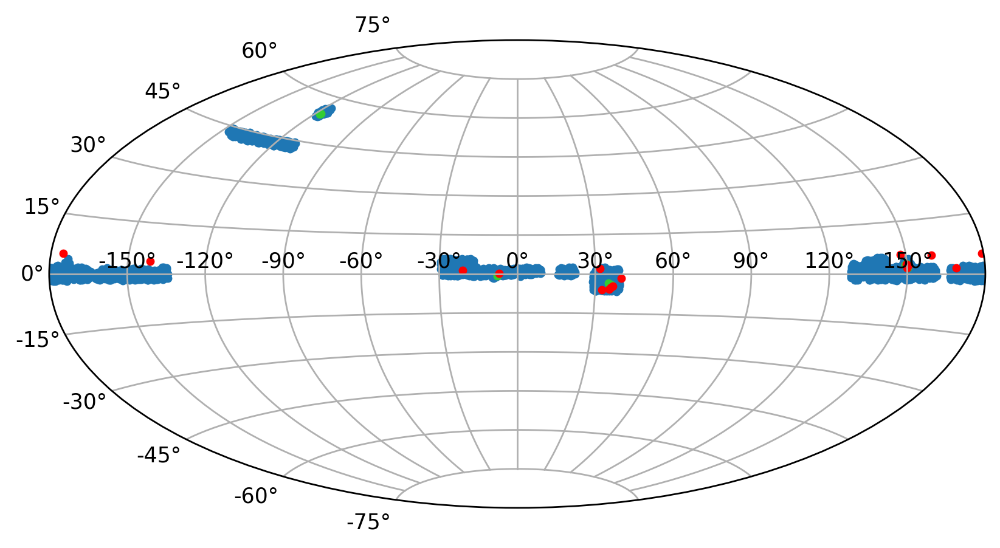

In [5]:
# Plot the locations of the definitely not real matches against the CAMIRA catalogue
icl_ra = good_icl_coords.icrs.ra.wrap_at(180*u.deg).radian
icl_dec = good_icl_coords.icrs.dec.radian
bad_icl_ra = bad_icl_coords.icrs.ra.wrap_at(180*u.deg).radian
bad_icl_dec = bad_icl_coords.icrs.dec.radian
camira_ra = cat_coords.icrs.ra.wrap_at(180*u.deg).radian
camira_dec = cat_coords.icrs.dec.radian

fig = plt.figure(figsize=(8,4), dpi=250)
plt.subplot(111, projection='aitoff')
plt.grid(True)
plt.scatter(camira_ra, camira_dec, marker='.')
plt.scatter(icl_ra, icl_dec, marker='.', color='limegreen')
plt.scatter(bad_icl_ra, bad_icl_dec, marker='.', color='red')
plt.show()

(array([6., 1., 1., 3., 0., 0., 0., 0., 0., 1.]),
 array([0.01282206, 0.18714528, 0.3614685 , 0.53579171, 0.71011493,
        0.88443815, 1.05876136, 1.23308458, 1.40740779, 1.58173101,
        1.75605423]),
 <BarContainer object of 10 artists>)

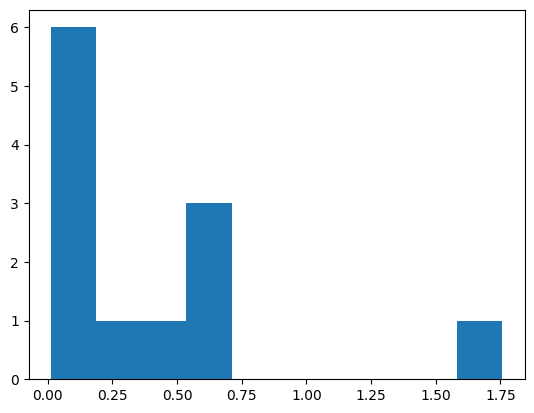

In [6]:
plt.hist(sep2d.arcmin)

In [7]:
# Make a table of the good matches
match_dict = {"Name": data["Cluster"][~mask], 
              "Lit RA": data["RA"][~mask],
              "Lit DEC": data["DEC"][~mask],
              "CAMIRA RA": table["RA"][idx],
              "CAMIRA DEC": table["DEC"][idx],
              "Sep (arcmin)": sep2d.arcmin, 
              "Lit Redshift": data["Redshift"][~mask], 
              "CAMIRA Redshift": table["z_cl"][idx]}

match_df = pandas.DataFrame(data=match_dict)
match_df

,Name,Lit RA,Lit DEC,CAMIRA RA,CAMIRA DEC,Sep (arcmin),Lit Redshift,CAMIRA Redshift
8,XMM022045,02h20m45.40s,-03d25m58.0s,35.166676,-3.451555,1.756054,0.330,0.3160
14,XMMXCS J161039.2+540604.0,242.664,54.101,242.658004,54.091910,0.584782,0.339,0.3400
16,XMMXCS J232923.6−004854.7,352.348,-0.815,352.348740,-0.815431,0.051378,0.300,0.3120
17,XMMXCS J161134.1+541640.5,242.892,54.278,242.899724,54.276265,0.289920,0.337,0.3421
18,XMMXCS J095902.7+025544.9,149.761,2.929,149.761347,2.929082,0.021367,0.349,0.3320
21,XMMXCS J095737.1+023428.9,149.405,2.575,149.401207,2.566327,0.567877,0.373,0.3939
23,XMMXCS J022148.1−034608.0,35.45,-3.769,35.440622,-3.771924,0.588234,0.432,0.4280
24,XMMXCS J022530.8−041421.1,36.378,-4.239,36.378198,-4.238511,0.031642,0.143,0.1670
25,XMMXCS J100047.3+013927.8,150.197,1.658,150.189763,1.657360,0.435734,0.221,0.2140
27,XMMXCS J022524.8−044043.4,36.353,-4.679,36.352973,-4.679212,0.012822,0.264,0.2569


In [8]:
# Function to convert ra/dec offset (in degrees) into pixel offset
def radec_to_px(ra_offset, dec_offset):
    asec_to_px = 1/0.168

    ra_offset_asec = ra_offset * 3600
    dec_offset_asec = dec_offset * 3600
    return ra_offset_asec * asec_to_px, dec_offset_asec * asec_to_px

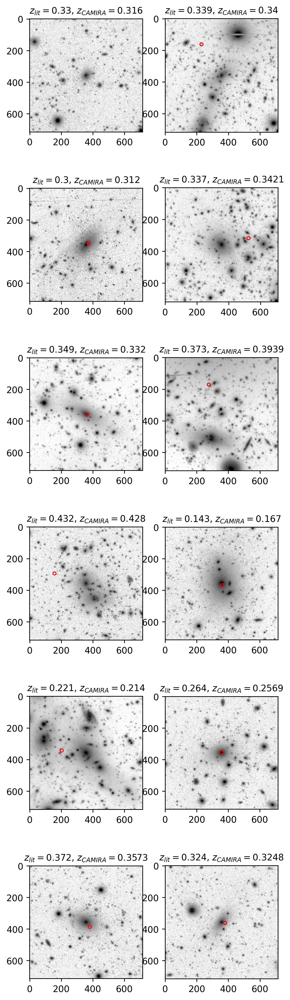

In [9]:
cutouts = h5py.File('../processed/cutouts.hdf', 'r') # Use the HDF file (constructed with create_hdf.py) instead of the cutouts folder, since those IDs are consistent with the catalogue
matched_cutouts = []
for i in idx:
    matched_cutouts.append(cutouts[str(i)]['HDU0']['DATA']) # Get the image data out for the clusters

norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

good_cat = cat_coords[idx]

plt.figure(figsize=(5,20), dpi=250)
for i in range(12):
    plt.subplot(6, 2, i+1)
    plt.imshow(matched_cutouts[i], norm=norm, cmap="gray_r") # Display the cutout
    # Draw a circle at the location of the literature cluster
    px_offset = radec_to_px(good_cat[i].ra.deg - good_icl_coords[i].ra.deg, good_cat[i].dec.deg - good_icl_coords[i].dec.deg)
    (x,y) = (matched_cutouts[i].shape[0] // 2 + px_offset[0], matched_cutouts[i].shape[1] // 2 + px_offset[1])
    circ = patches.Circle((x,y), 10, fill=False, color="red")
    ax = plt.gca()
    ax.add_patch(circ)
    # Add info as title
    plt.title(f'$z_{{lit}}={match_df["Lit Redshift"].iloc[i]}$, $z_{{CAMIRA}}={match_df["CAMIRA Redshift"].iloc[i]}$', fontsize=10)

plt.show()

# Get table list from /Library/Python/3.9/site-packages/unagi-0.1.3.dev19-py3.9.egg/unagi/data/pdr2_wide/pdr2_wide_tables.fits


Text(0.5, 1.0, '$z_{lit}=0.33$, $z_{CAMIRA}=0.316$')

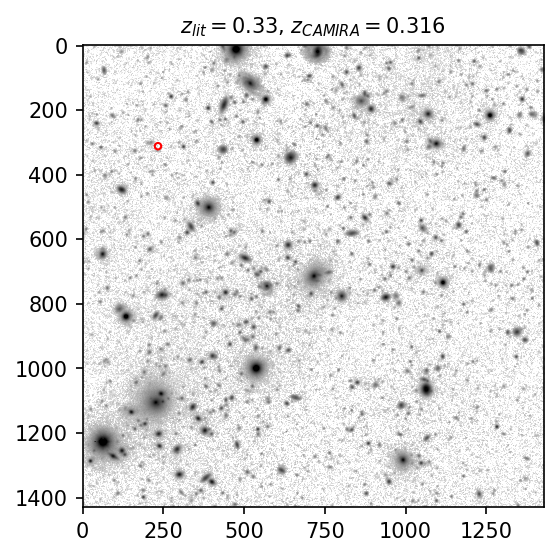

In [11]:
# Download a larger cutout for that one cluster where lit location doesn't fit in the cutout
# zyNtk1So2TUMMbDqInxXnRM3a759GyqChhGm6xmD
c = cat_coords[idx[0]]
pdr2 = hsc.Hsc(dr='pdr2', rerun='pdr2_wide')
cutout = hsc_cutout(c, cutout_size=2*u.arcmin, filters='r', archive=pdr2, use_saved=False, output_dir="", verbose=False, save_output=False)
cutout = cutout[1].data

plt.figure(figsize=(4,4), dpi=150)
plt.imshow(cutout, norm=norm, cmap="gray_r") # Display the cutout
# Draw a circle at the location of the literature cluster
px_offset = radec_to_px(good_cat[0].ra.deg - good_icl_coords[0].ra.deg, good_cat[0].dec.deg - good_icl_coords[0].dec.deg)
(x,y) = (cutout.shape[0] // 2 + px_offset[0], cutout.shape[1] // 2 + px_offset[1])
circ = patches.Circle((x,y), 10, fill=False, color="red")
ax = plt.gca()
ax.add_patch(circ)
# Add info as title
plt.title(f'$z_{{lit}}={match_df["Lit Redshift"].iloc[0]}$, $z_{{CAMIRA}}={match_df["CAMIRA Redshift"].iloc[0]}$', fontsize=10)


In [12]:
# By visual inspection, throwing out [0, 1, 5, 6] as unlikely to be a real match between literature cluster and CAMIRA cluster
real_match_df = match_df.iloc[[2, 3, 4, 7, 8, 9, 10, 11]]
real_match_df

,Name,Lit RA,Lit DEC,CAMIRA RA,CAMIRA DEC,Sep (arcmin),Lit Redshift,CAMIRA Redshift
16,XMMXCS J232923.6−004854.7,352.348,-0.815,352.348740,-0.815431,0.051378,0.300,0.3120
17,XMMXCS J161134.1+541640.5,242.892,54.278,242.899724,54.276265,0.289920,0.337,0.3421
18,XMMXCS J095902.7+025544.9,149.761,2.929,149.761347,2.929082,0.021367,0.349,0.3320
24,XMMXCS J022530.8−041421.1,36.378,-4.239,36.378198,-4.238511,0.031642,0.143,0.1670
25,XMMXCS J100047.3+013927.8,150.197,1.658,150.189763,1.657360,0.435734,0.221,0.2140
27,XMMXCS J022524.8−044043.4,36.353,-4.679,36.352973,-4.679212,0.012822,0.264,0.2569
28,XMMXCS J095951.2+014045.8,149.963,1.679,149.964113,1.680330,0.104037,0.372,0.3573
29,XMMXCS J022401.9−050528.4,36.008,-5.091,36.009025,-5.090751,0.063053,0.324,0.3248


[2317   73   39   18   45   17  967   14]


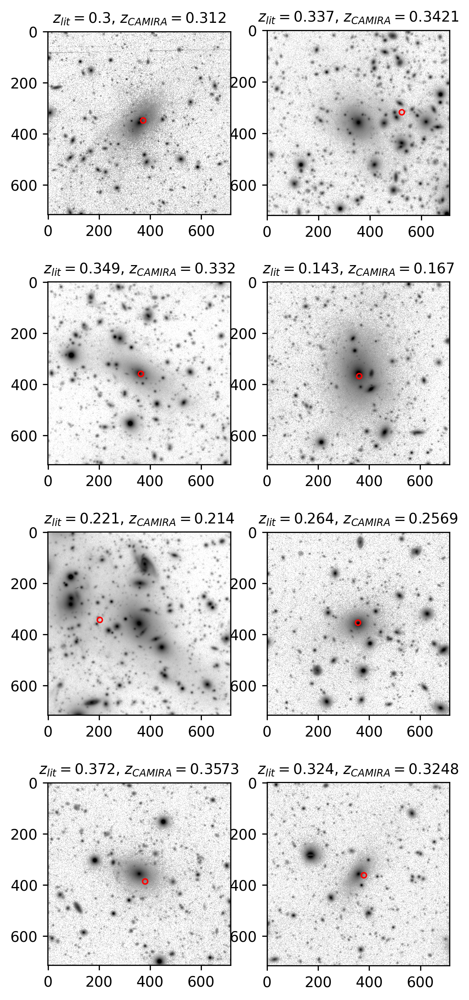

In [18]:
print(idx[[2, 3, 4, 7, 8, 9, 10, 11]])
# Display final set of real matches
matched_cutouts = []
for i in idx[[2, 3, 4, 7, 8, 9, 10, 11]]:
    matched_cutouts.append(cutouts[str(i)]['HDU0']['DATA']) # Get the image data out for the clusters

norm = ImageNormalize(vmin=0, vmax=10, stretch=LogStretch())

good_cat = cat_coords[idx[[2, 3, 4, 7, 8, 9, 10, 11]]]

plt.figure(figsize=(5,12), dpi=250)
for i in range(8):
    plt.subplot(4, 2, i+1)
    plt.imshow(matched_cutouts[i], norm=norm, cmap="gray_r") # Display the cutout
    # Draw a circle at the location of the literature cluster
    px_offset = radec_to_px(good_cat[i].ra.deg - real_match_df.iloc[[i]]["Lit RA"].values[0], good_cat[i].dec.deg - real_match_df.iloc[[i]]["Lit DEC"].values[0])
    (x,y) = (matched_cutouts[i].shape[0] // 2 + px_offset[0], matched_cutouts[i].shape[1] // 2 + px_offset[1])
    circ = patches.Circle((x,y), 10, fill=False, color="red")
    ax = plt.gca()
    ax.add_patch(circ)
    # Add info as title
    plt.title(f'$z_{{lit}}={real_match_df["Lit Redshift"].iloc[i]}$, $z_{{CAMIRA}}={real_match_df["CAMIRA Redshift"].iloc[i]}$', fontsize=10)

plt.show()